# Explicabilidade do DistilBERT treinado no IMDB
-----------------------

**Equipe**


* Amadeo Tato - atcn
* Arthur Henrique - ahac
* Bruno Henrique - bhsm
* Cauê Addae - casg

## Treinando o Modelo

### Imports

In [ ]:
!pip install -q accelerate -U
!pip install -q datasets transformers[torch]

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.3/21.3 MB 42.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 547.8/547.8 kB 9.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 39.9/39.9 MB 13.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 13.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 64.9/64.9 kB 6.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.1/194.1 kB 18.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 13.0 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
cudf-cu12 24.4.1 requires pyarrow<15.0.0a0,>=14.0.1, but you have pyarrow 17.0.0 which is incompatible.
google-colab 1.0.0 requires requests==2.31.0, but you have requests 2.32.3 which is incompatible.
ibis-framework 8.0.0 requires pyarrow<16,>=2, but 

In [ ]:
import joblib
import pandas as pd
import torch
from torch.utils.data import random_split
from transformers import (
    AutoModelForSequenceClassification,
    AutoTokenizer,
    TrainingArguments,
    Trainer,
    DataCollatorWithPadding,
    TextClassificationPipeline
)
from datasets import load_dataset, load_metric, get_dataset_split_names, Dataset, DatasetDict, concatenate_datasets
from google.colab import files
import numpy as np

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


### Constants

In [ ]:
#definindo SEED
SEED = 18_07_2024_2

PATHS = {'amadeo': r'/content/drive/MyDrive/Eletivas/Responsible AI/Projeto FINAL',
         'arthur': r'/content/drive/MyDrive/',
         'bruno': r'/content/drive/MyDrive/Disciplinas/2024.1/Tópicos IF807 - Responsible AI/Projeto FINAL',
         'caue': r'/content/drive/MyDrive/'}

USER = 'amadeo'

PROJECT_FOLDER = PATHS[USER]
MODELS_FOLDER = PROJECT_FOLDER + '/Models'
MOVIES_DATASETS_FOLDER = PROJECT_FOLDER + '/Movies Datasets'

In [ ]:
# Definindo o device para ser a GPU
device = "cuda:0" if torch.cuda.is_available() else "cpu"
print(device)

cpu


### Importing Dataset

In [ ]:
imdb_dataset = load_dataset('imdb')

# Verificação dos splits e da quantidade de exemplos em cada split
print(imdb_dataset)

#shape
print(imdb_dataset.shape)

# Exemplos
print(imdb_dataset['train'][0:2])

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


Generating train split:   0%|          | 0/25000 [00:00<?, ? examples/s]

Generating test split:   0%|          | 0/25000 [00:00<?, ? examples/s]

Generating unsupervised split:   0%|          | 0/50000 [00:00<?, ? examples/s]

DatasetDict({
    train: Dataset({
        features: ['text', 'label'],
        num_rows: 25000
    })
    test: Dataset({
        features: ['text', 'label'],
        num_rows: 25000
    })
    unsupervised: Dataset({
        features: ['text', 'label'],
        num_rows: 50000
    })
})
{'train': (25000, 2), 'test': (25000, 2), 'unsupervised': (50000, 2)}
{'text': ['I rented I AM CURIOUS-YELLOW from my video store because of all the controversy that surrounded it when it was first released in 1967. I also heard that at first it was seized by U.S. customs if it ever tried to enter this country, therefore being a fan of films considered "controversial" I really had to see this for myself.<br /><br />The plot is centered around a young Swedish drama student named Lena who wants to learn everything she can about life. In particular she wants to focus her attentions to making some sort of documentary on what the average Swede thought about certain political issues such as the Vietnam War 

In [ ]:
imdb_dataset['train'][1]

{'text': '"I Am Curious: Yellow" is a risible and pretentious steaming pile. It doesn\'t matter what one\'s political views are because this film can hardly be taken seriously on any level. As for the claim that frontal male nudity is an automatic NC-17, that isn\'t true. I\'ve seen R-rated films with male nudity. Granted, they only offer some fleeting views, but where are the R-rated films with gaping vulvas and flapping labia? Nowhere, because they don\'t exist. The same goes for those crappy cable shows: schlongs swinging in the breeze but not a clitoris in sight. And those pretentious indie movies like The Brown Bunny, in which we\'re treated to the site of Vincent Gallo\'s throbbing johnson, but not a trace of pink visible on Chloe Sevigny. Before crying (or implying) "double-standard" in matters of nudity, the mentally obtuse should take into account one unavoidably obvious anatomical difference between men and women: there are no genitals on display when actresses appears nude, 

### Importing DistilBERT from HuggingFace

In [ ]:
model_name = "distilbert-base-uncased"

In [ ]:
model = AutoModelForSequenceClassification.from_pretrained(model_name)
tokenizer = AutoTokenizer.from_pretrained(model_name)

config.json:   0%|          | 0.00/483 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/268M [00:00<?, ?B/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

### Training model

In [ ]:
def tokenization(example,feat_name='text'):
  outputs = tokenizer(example[feat_name], truncation=True)
  return outputs

In [ ]:
tokenized_imdb_dataset = imdb_dataset.map(tokenization, batched=True)

Map:   0%|          | 0/25000 [00:00<?, ? examples/s]

Map:   0%|          | 0/25000 [00:00<?, ? examples/s]

Map:   0%|          | 0/50000 [00:00<?, ? examples/s]

In [ ]:
training_args = TrainingArguments(output_dir=MODELS_FOLDER+"/distilbert-imdb",
                                  num_train_epochs=1,
                                  evaluation_strategy="epoch",
                                  save_steps=1000,
                                  seed=SEED)

def compute_metrics(eval_preds):
    accuracy_metric = load_metric("accuracy")
    f1_metric = load_metric("f1")

    logits, labels = eval_preds
    predictions = np.argmax(logits, axis=-1)

    accuracy = accuracy_metric.compute(predictions=predictions, references=labels)["accuracy"]
    f1 = f1_metric.compute(predictions=predictions, references=labels)["f1"]

    return {"accuracy": accuracy, "f1":f1}

model = model.to(device)
trainer = Trainer(model=model,
                  args=training_args, tokenizer=tokenizer,
                  train_dataset=tokenized_imdb_dataset["train"],
                  eval_dataset=tokenized_imdb_dataset["test"],
                  compute_metrics=compute_metrics)

/usr/local/lib/python3.10/dist-packages/transformers/training_args.py:1474: FutureWarning: `evaluation_strategy` is deprecated and will be removed in version 4.46 of 🤗 Transformers. Use `eval_strategy` instead
  warnings.warn(


In [ ]:
#tokenized_imdb_dataset['train'][1]

{'text': '"I Am Curious: Yellow" is a risible and pretentious steaming pile. It doesn\'t matter what one\'s political views are because this film can hardly be taken seriously on any level. As for the claim that frontal male nudity is an automatic NC-17, that isn\'t true. I\'ve seen R-rated films with male nudity. Granted, they only offer some fleeting views, but where are the R-rated films with gaping vulvas and flapping labia? Nowhere, because they don\'t exist. The same goes for those crappy cable shows: schlongs swinging in the breeze but not a clitoris in sight. And those pretentious indie movies like The Brown Bunny, in which we\'re treated to the site of Vincent Gallo\'s throbbing johnson, but not a trace of pink visible on Chloe Sevigny. Before crying (or implying) "double-standard" in matters of nudity, the mentally obtuse should take into account one unavoidably obvious anatomical difference between men and women: there are no genitals on display when actresses appears nude, 

In [ ]:
#trainer.train()

Epoch,Training Loss,Validation Loss,Accuracy,F1
1,0.254200,0.229793,0.925800,0.926163


<ipython-input-11-46335a35ac84>:8: FutureWarning: load_metric is deprecated and will be removed in the next major version of datasets. Use 'evaluate.load' instead, from the new library 🤗 Evaluate: https://huggingface.co/docs/evaluate
  accuracy_metric = load_metric("accuracy")


The repository for accuracy contains custom code which must be executed to correctly load the dataset. You can inspect the repository content at https://hf.co/datasets/accuracy.
You can avoid this prompt in future by passing the argument `trust_remote_code=True`.

Do you wish to run the custom code? [y/N] y


The repository for f1 contains custom code which must be executed to correctly load the dataset. You can inspect the repository content at https://hf.co/datasets/f1.
You can avoid this prompt in future by passing the argument `trust_remote_code=True`.

Do you wish to run the custom code? [y/N] y


TrainOutput(global_step=3125, training_loss=0.3065309924316406, metrics={'train_runtime': 1856.3968, 'train_samples_per_second': 13.467, 'train_steps_per_second': 1.683, 'total_flos': 3117512597607552.0, 'train_loss': 0.3065309924316406, 'epoch': 1.0})

In [ ]:
#trainer.evaluate()

{'eval_loss': 0.22979271411895752,
 'eval_accuracy': 0.9258,
 'eval_f1': 0.9261632766787407,
 'eval_runtime': 388.2994,
 'eval_samples_per_second': 64.383,
 'eval_steps_per_second': 8.048,
 'epoch': 1.0}

In [ ]:
#Salvando o modelo
#model.save_pretrained(MODELS_FOLDER+'/imdb_model_pretrained')

# Importando Modelo

In [ ]:
id2label = {0: "NEGATIVE", 1: "POSITIVE"}
label2id = {"NEGATIVE": 0, "POSITIVE": 1}

In [ ]:
model = AutoModelForSequenceClassification.from_pretrained(MODELS_FOLDER+'/imdb_model_pretrained', num_labels=2, id2label=id2label, label2id=label2id).to(device)
tokenizer = AutoTokenizer.from_pretrained("distilbert-base-uncased")
pipeline = TextClassificationPipeline(model=model, tokenizer=tokenizer)

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/483 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

In [ ]:
model.config

DistilBertConfig {
  "_name_or_path": "/content/drive/MyDrive/Eletivas/Responsible AI/Projeto FINAL/Models/imdb_model_pretrained",
  "activation": "gelu",
  "architectures": [
    "DistilBertForSequenceClassification"
  ],
  "attention_dropout": 0.1,
  "dim": 768,
  "dropout": 0.1,
  "hidden_dim": 3072,
  "id2label": {
    "0": "NEGATIVE",
    "1": "POSITIVE"
  },
  "initializer_range": 0.02,
  "label2id": {
    "NEGATIVE": 0,
    "POSITIVE": 1
  },
  "max_position_embeddings": 512,
  "model_type": "distilbert",
  "n_heads": 12,
  "n_layers": 6,
  "pad_token_id": 0,
  "problem_type": "single_label_classification",
  "qa_dropout": 0.1,
  "seq_classif_dropout": 0.2,
  "sinusoidal_pos_embds": false,
  "tie_weights_": true,
  "torch_dtype": "float32",
  "transformers_version": "4.42.4",
  "vocab_size": 30522
}

## Teste de inferência

In [ ]:
id = 20_000

text = imdb_dataset['test'][id]['text']
text_label = imdb_dataset['test'][id]['label']

print(text)
print(text_label)

I turned over to this film in the middle of the night and very nearly skipped right passed it. It was only because there was nothing else on that I decided to watch it. In the end, I thought it was great.<br /><br />An interesting storyline, good characters, a clever script and brilliant directing makes this a fine film to sit down and watch. This was, in fact, the first I'd heard of this movie, but I would have been happy to have paid money to see this at the cinema.<br /><br />My IMDB Rating : 8 out of 10<br /><br />
1


In [ ]:
inputs = tokenizer(text, return_tensors="pt")

with torch.no_grad():
    logits = model(**inputs).logits

In [ ]:
predicted_class_id = logits.argmax().item()
predicted_class_id

1

## SHAP

In [ ]:
!pip install --quiet shap

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 540.1/540.1 kB 10.5 MB/s eta 0:00:00


In [ ]:
import shap
import matplotlib.pyplot as plt

In [ ]:
# load JS visualization code to notebook
shap.initjs()

In [ ]:
prediction = pipeline(['text'])
print(prediction[0])

{'label': 'POSITIVE', 'score': 0.633105456829071}


### Obtendo os valores de SHAP para a explicação

In [ ]:
explainer = shap.Explainer(pipeline)

In [ ]:
shap_values = explainer(imdb_dataset['train']['text'][0:2])

In [ ]:
PROJECT_FOLDER

In [ ]:
with open(PROJECT_FOLDER+'/shap_vals.pkl', 'wb') as shv:
    joblib.dump(shap_values, shv)
    shv.close()

In [ ]:
with open(PROJECT_FOLDER+'/shap_vals.pkl', 'rb') as shv:
    new_vals = joblib.load(shv)
    shv.close()

In [ ]:
shap.plots.text(new_vals)

### Explicando as predições para um filme/série específico
Link do dataset: [kaggle.com/datasets/itsnobita/one-piece-live-action-imdb-reviews](https://www.kaggle.com/datasets/itsnobita/one-piece-live-action-imdb-reviews)


In [ ]:
op_dataset_df = pd.read_csv(MOVIES_DATASETS_FOLDER+'/one_piece_review.csv')
op_dataset_df = op_dataset_df.drop(columns='Unnamed: 0')
op_dataset_df

,Review,Rating,word_count
0,I have to admit that I've never watched any of...,1,140
1,I'm a 60yo man & old school like the The Marin...,1,172
2,Every live action anime that I've briefly seen...,1,336
3,This is bar none one of the best live-action a...,1,335
4,"Being a one piece fan myself, I was a bit inse...",1,109
...,...,...,...
760,I haven't written a review in a very long time...,1,132
761,This is my first IMDb review.\n\nI've watched ...,1,196
762,"An absolute gem! This show is a must-watch, an...",1,173
763,I recently dived (no pun intended) into the wo...,1,391


Adaptando as labels para o formato do IMDB


In [ ]:
op_dataset_df['Label'] = op_dataset_df['Rating'].apply(lambda x: 'POSITIVE' if x == 1 else 'NEGATIVE')
op_dataset_df

,Review,Rating,word_count,Label
0,I have to admit that I've never watched any of...,1,140,POSITIVE
1,I'm a 60yo man & old school like the The Marin...,1,172,POSITIVE
2,Every live action anime that I've briefly seen...,1,336,POSITIVE
3,This is bar none one of the best live-action a...,1,335,POSITIVE
4,"Being a one piece fan myself, I was a bit inse...",1,109,POSITIVE
...,...,...,...,...
760,I haven't written a review in a very long time...,1,132,POSITIVE
761,This is my first IMDb review.\n\nI've watched ...,1,196,POSITIVE
762,"An absolute gem! This show is a must-watch, an...",1,173,POSITIVE
763,I recently dived (no pun intended) into the wo...,1,391,POSITIVE


In [ ]:
op_dataset_df[op_dataset_df['Label'] == 'NEGATIVE']

,Review,Rating,word_count,Label
49,I wanted this to be more like Kung Fu Hustle o...,0,165,NEGATIVE
54,"I am episode 6, and i want to puke.\n\nThis is...",0,351,NEGATIVE
65,"Forget this one, just read the manga please if...",0,1248,NEGATIVE
80,There's so many reviews all the same 10/10 tha...,0,121,NEGATIVE
83,I liked the first episode as a spin-off. Casti...,0,136,NEGATIVE
...,...,...,...,...
707,The only people giving positive reviews are od...,0,159,NEGATIVE
708,"It feels like, the writers of the adaptation o...",0,131,NEGATIVE
713,"One thing I can say for sure, subjective as it...",0,223,NEGATIVE
715,Aprt fron VFX there is nothing to watch. They ...,0,115,NEGATIVE


Obtendo os valores shap para as reviews

In [ ]:
shap_values = explainer(op_dataset_df['Review'][0:100])

  0%|          | 0/498 [00:00<?, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:   2%|▏         | 2/100 [00:00<?, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:   4%|▍         | 4/100 [00:19<06:52,  4.29s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:   7%|▋         | 7/100 [00:37<07:41,  4.96s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  16%|█▌        | 16/100 [01:15<05:51,  4.18s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  17%|█▋        | 17/100 [01:22<07:34,  5.48s/it]


RuntimeError: The size of tensor a (819) must match the size of tensor b (512) at non-singleton dimension 1

Houveram reviews com mais tokens do que o suporado pelo modelo, devido a isso, removemos as reviews com mais de 300 palavras do dataset

In [ ]:
op_dataset_df_short = op_dataset_df[op_dataset_df['word_count'] <= 300]
op_dataset_df_short

,Review,Rating,word_count,Label
0,I have to admit that I've never watched any of...,1,140,POSITIVE
1,I'm a 60yo man & old school like the The Marin...,1,172,POSITIVE
4,"Being a one piece fan myself, I was a bit inse...",1,109,POSITIVE
5,GREAT ADAPTATION! As an old-school fan (since ...,1,116,POSITIVE
6,My kids play and watch One Piece anime and lov...,1,130,POSITIVE
...,...,...,...,...
759,"As a big one piece fan, i thought this adaptat...",1,116,POSITIVE
760,I haven't written a review in a very long time...,1,132,POSITIVE
761,This is my first IMDb review.\n\nI've watched ...,1,196,POSITIVE
762,"An absolute gem! This show is a must-watch, an...",1,173,POSITIVE


Verificamos a distribuição do dataset após o recorte das reviews longas. Podemos ver que ele é desbalanceado e possui muito mais exemplos da classe positiva. Calculamos a acurácia geral e por classe do modelo para obter o quanto ele generalizou para uma base não vista antes.

In [ ]:
op_dataset_df_short['Label'].value_counts()

Label
POSITIVE    616
NEGATIVE     64
Name: count, dtype: int64

In [ ]:
from tqdm import tqdm

right_predictions_count = 0
right_positive_predictions_count = 0
right_negative_predictions_count = 0

wrong_predictions_reviews = []

for review,label in tqdm(op_dataset_df_short[['Review','Label']].values):
  prediction_op = pipeline.predict(review)

  if prediction_op[0]['label'] == label:
    right_predictions_count+=1
    if label == 'POSITIVE':
      right_positive_predictions_count+=1
    else:
      right_negative_predictions_count+=1
  else:
    wrong_predictions_reviews.append((review,label))

print('\n\nAccuracy OP:', right_predictions_count/len(op_dataset_df_short))
print('Accuracy POSITIVE OP:', right_positive_predictions_count/len(op_dataset_df_short[op_dataset_df_short['Label']=='POSITIVE']))
print('Accuracy NEGATIVE OP:', right_negative_predictions_count/len(op_dataset_df_short[op_dataset_df_short['Label']=='NEGATIVE']))

100%|██████████| 680/680 [05:33<00:00,  2.04it/s]



Accuracy OP: 0.9588235294117647
Accuracy POSITIVE OP: 0.9642857142857143
Accuracy NEGATIVE OP: 0.90625


Como podemos ver, o modelo obteve ótimas acurácias para ambas as classes, sendo assim, não será preciso realizar um fine-tuning desse para o dataset específico.

#### Explicando as predições corretas do modelo

##### Exemplo #1

In [ ]:
op_dataset_df_short.loc[0]['Review']

"I have to admit that I've never watched any of the animated show One Piece or even heard about it for that matter. I'm really not a big fan of anime. Then after watching the trailers for this I thought it looked like a show for children. I was wrong. I kept reading about how good this show is and how it's #1 on Netflix so I thought I'd give it a chance. I'm glad I did because I couldn't have been more wrong. This is a show where people of all ages can enjoy. If you can just turn off your brain and watch I promise you'll have a good time. If you're looking for a new show to binge then give One Piece a try. You won't be disappointed!"

In [ ]:
op_dataset_df_short.loc[0]['Label']

'POSITIVE'

In [ ]:
shap_values_sample = explainer([op_dataset_df_short.loc[0]['Review']])

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [03:06, 186.37s/it]              


In [ ]:
shap.plots.text(shap_values_sample)

##### Exemplo #2

In [ ]:
op_dataset_df_short.loc[49]['Review']

"I wanted this to be more like Kung Fu Hustle or Hook, but it really didn't feel like the director had a clear vision for the final product. It feels more like a broadway play, with poor direction, cheesy dialogue and over-acting. Like many other manga to live action attempts, it really misses the mark and is riddled with plot holes as they desperately try to squeeze five episodes into one and take zero chances at veering away from the anime in fear of upsetting the fans. The cheesy music and dialogue mixed with violence was confusing, I couldn't tell if this was meant for adults or kids? If something is going to to be sooo unbearably tacky, they should have picked a lane and really ramped up the violence or put more effort into the script. Really stupid and definitely DOES NOT BREAK THE CURSE of all anime live actions being terrible. This one is absolute trash and not the exception."

In [ ]:
op_dataset_df_short.loc[49]['Label']

'NEGATIVE'

In [ ]:
shap_values_sample = explainer([op_dataset_df_short.loc[49]['Review']])

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [03:20, 200.98s/it]              


In [ ]:
shap.plots.text(shap_values_sample)

#### Explicando as predições erradas do modelo

In [ ]:
wrong_predctions_df = pd.DataFrame(wrong_predictions_reviews,columns=['Review','Label'])
wrong_predctions_df

,Review,Label
0,Having watched a good portion of One Piece ani...,POSITIVE
1,There's so many reviews all the same 10/10 tha...,NEGATIVE
2,I wasn't expecting this.. i mean i had only wa...,POSITIVE
3,The storyline is impressive but the casting of...,POSITIVE
4,"Netflix, and others, have shown they can not a...",POSITIVE
5,I'm sort of a BIG Anime fan - heck the majorit...,POSITIVE
6,This is amazing.\n\nI really hated the anime. ...,POSITIVE
7,HATERS There are many types of haters in this ...,POSITIVE
8,Broo w*f is this... the series is totally fked...,NEGATIVE
9,It's not the best part of one piece. Not even ...,POSITIVE


##### Exemplo #1

In [ ]:
wrong_predctions_df.loc[0]['Review']

"Having watched a good portion of One Piece anime this show is exactly what you'd hope for! The outrageousness of the anime is truly on display in this live action and you wouldn't want it any other way. My sold issue with this show and it's not even the shows fault but the limited amount of episodes for season 1 is truly disappointing. So many of this new seasons are going to 8 episodes or so which is the companies fault. There are numerous shows that would have benefited so much if they could've had a few more episodes and for a anime show like this it DESERVES to have had more than just 8 to get started. Netflix scored on a perfection live action but burned us on limiting season 1 to only 8 episodes."

In [ ]:
wrong_predctions_df.loc[0]['Label']

'POSITIVE'

In [ ]:
shap_values_sample = explainer([wrong_predctions_df.loc[0]['Review']])

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [03:33, 213.67s/it]              


In [ ]:
shap.plots.text(shap_values_sample)

##### Exemplo #2

In [ ]:
wrong_predctions_df.loc[1]['Review']

"There's so many reviews all the same 10/10 that go along the lines of\n\nI thought it was going to disappoint but I surprised by how good it is\n\nLive action adaption they nailed it\n\nThe reality is.\n\nI'd say this show is the usual Netflix standard, like 5 out of 10. Max.\n\nHas all the usual issues of a Netflix show, actors don't seem to be cast based on talent, no meaningful story arcs, not many characters that you would like. Childish dialogue- nobody talks like these people\n\nI read a review that said they spent $17,000,000 an episode, I reckon Adam Goldberg could have made a more involving story for $17 an episode."

In [ ]:
wrong_predctions_df.loc[1]['Label']

'NEGATIVE'

In [ ]:
shap_values_sample = explainer([wrong_predctions_df.loc[1]['Review']])

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [03:21, 201.29s/it]              


In [ ]:
shap.plots.text(shap_values_sample)

##### Exemplo #3

In [ ]:
wrong_predctions_df.loc[2]['Review']

"I wasn't expecting this.. i mean i had only watched 125 something episodes of one piece and even after watching the same story, it really felt like One Piece. The crew had their personalities done really well. It was like watching a live action anime. Couldn't stop watching it. Binged watched it all in one go. Sooo looking forward to the next season and hopefully it will be an even better experience. Ot has so much potential. If they stick to the source material and keep the cgi the same. It will be remembered far better than witcher (let's not mention that disappointment). It will be interesting to see how Netflix does it and hopefully they won't mess it up."

In [ ]:
wrong_predctions_df.loc[2]['Label']

'POSITIVE'

In [ ]:
shap_values_sample = explainer([wrong_predctions_df.loc[2]['Review']])

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [03:05, 185.60s/it]              


In [ ]:
shap.plots.text(shap_values_sample)

#### Obtendo a influência dos tokens mais significativos globalmente para o modelo

In [ ]:
shap_values = explainer(op_dataset_df_short['Review'])

  0%|          | 0/498 [00:00<?, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:   0%|          | 2/680 [00:00<?, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:   1%|          | 4/680 [00:24<44:57,  3.99s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:   1%|          | 5/680 [00:31<57:48,  5.14s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:   2%|▏         | 14/680 [01:11<44:51,  4.04s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:   3%|▎         | 18/680 [01:30<48:26,  4.39s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:   4%|▎         | 24/680 [01:58<49:49,  4.56s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:   5%|▌         | 34/680 [02:42<45:52,  4.26s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:   5%|▌         | 35/680 [02:48<52:04,  4.84s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:   6%|▌         | 41/680 [03:17<49:12,  4.62s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:   6%|▌         | 42/680 [03:23<55:17,  5.20s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:   8%|▊         | 52/680 [04:10<44:51,  4.29s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:   8%|▊         | 55/680 [04:23<45:49,  4.40s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:   8%|▊         | 56/680 [04:29<51:32,  4.96s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:   9%|▉         | 61/680 [04:52<45:27,  4.41s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:   9%|▉         | 62/680 [04:58<51:11,  4.97s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:   9%|▉         | 63/680 [05:04<54:13,  5.27s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  10%|▉         | 66/680 [05:18<47:15,  4.62s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  11%|█         | 74/680 [05:52<44:22,  4.39s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  11%|█         | 75/680 [05:58<49:21,  4.90s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  11%|█         | 76/680 [06:05<53:28,  5.31s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  13%|█▎        | 87/680 [06:53<40:43,  4.12s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  14%|█▍        | 96/680 [07:34<41:50,  4.30s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  15%|█▍        | 99/680 [07:49<45:25,  4.69s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  15%|█▍        | 100/680 [07:54<47:06,  4.87s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  15%|█▌        | 102/680 [08:05<49:31,  5.14s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  16%|█▌        | 107/680 [08:30<44:38,  4.67s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  16%|█▌        | 110/680 [08:44<44:03,  4.64s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  16%|█▋        | 111/680 [08:50<48:23,  5.10s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  17%|█▋        | 113/680 [09:02<50:37,  5.36s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  18%|█▊        | 120/680 [09:33<40:19,  4.32s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  18%|█▊        | 122/680 [09:44<44:25,  4.78s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  19%|█▊        | 127/680 [10:06<39:52,  4.33s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  19%|█▉        | 130/680 [10:18<37:38,  4.11s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  20%|█▉        | 134/680 [10:40<43:20,  4.76s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  20%|██        | 136/680 [10:50<43:55,  4.84s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  21%|██        | 141/680 [11:12<38:01,  4.23s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  21%|██        | 144/680 [11:26<38:32,  4.31s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  22%|██▏       | 151/680 [11:57<39:01,  4.43s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  22%|██▎       | 153/680 [12:08<40:49,  4.65s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  23%|██▎       | 159/680 [12:35<36:02,  4.15s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  24%|██▎       | 160/680 [12:41<41:46,  4.82s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  24%|██▎       | 161/680 [12:47<45:46,  5.29s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  25%|██▍       | 168/680 [13:18<37:29,  4.39s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  25%|██▌       | 172/680 [13:36<37:33,  4.44s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  26%|██▌       | 174/680 [13:46<38:41,  4.59s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  26%|██▌       | 178/680 [14:05<38:57,  4.66s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  27%|██▋       | 181/680 [14:21<41:16,  4.96s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  27%|██▋       | 186/680 [14:43<34:01,  4.13s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  29%|██▊       | 195/680 [15:24<35:02,  4.33s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  29%|██▉       | 196/680 [15:30<37:22,  4.63s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  29%|██▉       | 198/680 [15:40<39:07,  4.87s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  30%|███       | 204/680 [16:08<34:50,  4.39s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  31%|███       | 211/680 [16:40<34:04,  4.36s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  32%|███▏      | 217/680 [17:08<33:37,  4.36s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  33%|███▎      | 223/680 [17:37<32:34,  4.28s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  33%|███▎      | 224/680 [17:44<38:54,  5.12s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  36%|███▌      | 244/680 [19:09<31:21,  4.32s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  36%|███▌      | 245/680 [19:16<36:24,  5.02s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  37%|███▋      | 249/680 [19:35<33:06,  4.61s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  38%|███▊      | 256/680 [20:04<28:49,  4.08s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  39%|███▊      | 262/680 [20:32<29:58,  4.30s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  39%|███▉      | 266/680 [20:51<30:58,  4.49s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  40%|███▉      | 270/680 [21:08<28:33,  4.18s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  43%|████▎     | 295/680 [22:53<27:31,  4.29s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  44%|████▍     | 299/680 [23:11<26:27,  4.17s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  44%|████▍     | 300/680 [23:19<32:51,  5.19s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  44%|████▍     | 302/680 [23:30<33:27,  5.31s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  45%|████▌     | 309/680 [24:02<26:20,  4.26s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  46%|████▋     | 315/680 [24:28<25:40,  4.22s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  46%|████▋     | 316/680 [24:35<31:08,  5.13s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  47%|████▋     | 317/680 [24:42<33:19,  5.51s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  48%|████▊     | 324/680 [25:12<24:18,  4.10s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  49%|████▊     | 331/680 [25:41<23:01,  3.96s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  52%|█████▏    | 351/680 [27:03<21:14,  3.87s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  52%|█████▏    | 352/680 [27:08<23:40,  4.33s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  53%|█████▎    | 359/680 [27:40<22:56,  4.29s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  55%|█████▍    | 373/680 [28:41<21:03,  4.12s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  55%|█████▌    | 374/680 [28:48<25:47,  5.06s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  55%|█████▌    | 375/680 [28:54<26:48,  5.27s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  56%|█████▋    | 384/680 [29:35<20:07,  4.08s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  57%|█████▋    | 387/680 [29:48<21:31,  4.41s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  59%|█████▉    | 403/680 [30:59<19:14,  4.17s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  60%|█████▉    | 406/680 [31:13<20:06,  4.40s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  61%|██████    | 414/680 [31:48<17:42,  3.99s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  62%|██████▏   | 420/680 [32:17<19:17,  4.45s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  62%|██████▏   | 421/680 [32:23<21:32,  4.99s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  65%|██████▌   | 443/680 [33:54<15:34,  3.94s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  68%|██████▊   | 462/680 [35:12<14:19,  3.94s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  68%|██████▊   | 465/680 [35:27<15:31,  4.33s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  69%|██████▉   | 469/680 [35:46<16:10,  4.60s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  77%|███████▋  | 524/680 [39:35<11:21,  4.37s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  81%|████████  | 548/680 [41:17<08:59,  4.09s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  82%|████████▏ | 560/680 [42:09<07:52,  3.94s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  82%|████████▎ | 561/680 [42:16<09:37,  4.85s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  83%|████████▎ | 563/680 [42:27<09:53,  5.07s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  83%|████████▎ | 564/680 [42:33<10:15,  5.31s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  85%|████████▌ | 578/680 [43:32<06:31,  3.84s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  85%|████████▌ | 580/680 [43:41<06:49,  4.09s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  88%|████████▊ | 597/680 [44:55<05:40,  4.10s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  90%|████████▉ | 610/680 [45:51<04:48,  4.12s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  91%|█████████▏| 621/680 [46:38<03:59,  4.06s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  91%|█████████▏| 622/680 [46:43<04:23,  4.54s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  93%|█████████▎| 633/680 [47:29<03:17,  4.21s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  96%|█████████▋| 655/680 [49:01<01:41,  4.05s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  98%|█████████▊| 665/680 [49:42<00:58,  3.88s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  99%|█████████▊| 671/680 [50:09<00:39,  4.34s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  99%|█████████▉| 674/680 [50:22<00:24,  4.14s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer: 681it [50:52,  4.50s/it]


In [ ]:
with open(PROJECT_FOLDER+'/shap_vals_one_piece.pkl', 'wb') as shv:
    joblib.dump(shap_values, shv)
    shv.close()

In [ ]:
with open(PROJECT_FOLDER+'/shap_vals_one_piece.pkl', 'rb') as shv:
    new_vals = joblib.load(shv)
    shv.close()

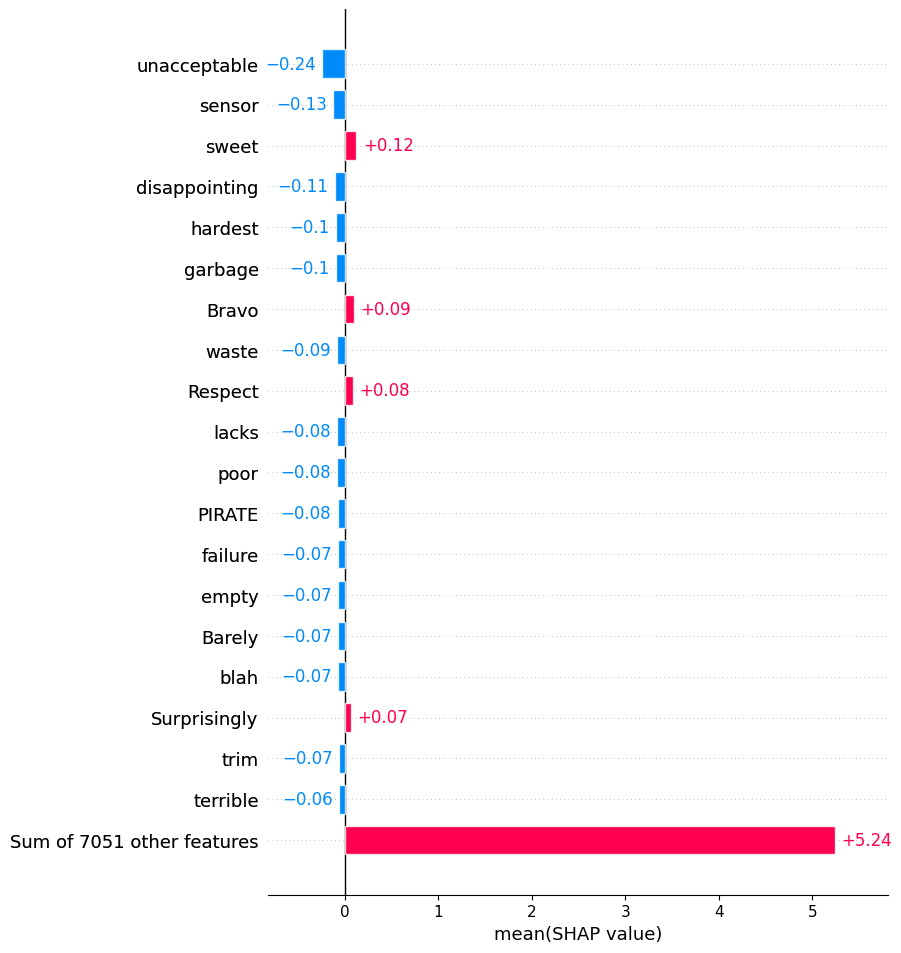

In [ ]:
shap.plots.bar(new_vals[:, :, "POSITIVE"].mean(0),max_display=20)

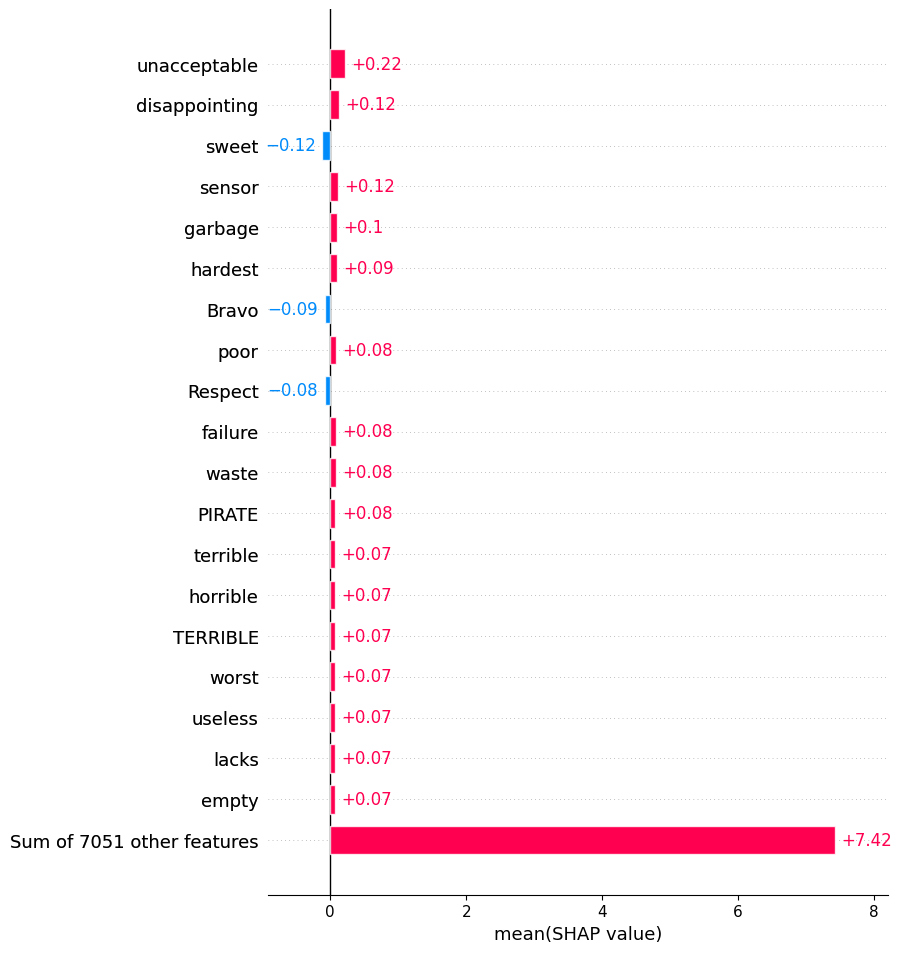

In [ ]:
shap.plots.bar(new_vals[:, :, "NEGATIVE"].mean(0),max_display=20)